# Train a SOM - outdated but fantastic examples.

First, try to import the following packages:

In [64]:
import xarray as xr
import numpy as np
from minisom import MiniSom
import pandas as pd
from sklearn.preprocessing import RobustScaler
import pprint
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.gridspec import GridSpec 
import matplotlib.colors as mcolors
from matplotlib import colormaps as cm


If any package is missing, uncomment one of the following and run it. This will install the packages to your home directory.

In [65]:
# !pip install MiniSom
# !pip install pprint

Import the helper functions

In [66]:
from som_training import read_and_transform, build_scaler, train_som

## Set the configuration dictionary:

```filename```
> Training data location

```var```
> The specific GEFS variable name you want to use to train the SOM

```wlon```
> The westernmost longitude you want to include in the subset (0 - 360 degrees)

```elon```
> The easternmost longitude you want to include in the subset (0 - 360 degrees)

```nlat```
> The northernmost longitude you want to include in the subset (0 - 90 degrees)

```slat```
> The southernmost longitude you want to include in the subset (0 - 90 degrees)

```som_config```
> ```x```: count of x-axis nodes
> ```y```: count of y-axis nodes
> ```sigma```: smoothing factor between neighboring nodes
> ```random_seed```: enables deterministic randomness for repeatability of results

```som_train```
> ```num_iteration```: number of training steps
> ```random_order```: If True, ignore the order of the input data and randomly introduce to SOM
> ```verbose```: If True, provide training status updates

## Train the SOM

In [6]:
trained_som, trained_scaler, train_info, xr_data = train_som(prefs)

current model configuration
{'input_len': 12141, 'random_seed': 42, 'sigma': 1.5, 'x': 4, 'y': 4}
current training configuration
{'data': array([[-0.20764902, -0.23119393, -0.24361178, ..., -1.2395693 ,
        -1.2173333 , -1.1963109 ],
       [-1.4186287 , -1.4350127 , -1.4346281 , ..., -0.7765814 ,
        -0.82266665, -0.85507244],
       [ 0.2818422 ,  0.26017943,  0.24590352, ..., -1.4993271 ,
        -1.4546666 , -1.4071146 ],
       ...,
       [-0.3730332 , -0.36277893, -0.34284404, ..., -0.4535666 ,
        -0.40933332, -0.36363637],
       [-0.90616745, -0.8806073 , -0.84565145, ..., -0.22072679,
        -0.21466666, -0.20948617],
       [-0.7407833 , -0.7584541 , -0.7617738 , ..., -0.3230148 ,
        -0.33066666, -0.33465084]], dtype=float32),
 'num_iteration': 10000,
 'random_order': True,
 'verbose': True}
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 44.49080114063429


## Visualize the SOM

In [7]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['figure.figsize'] = 7, 3

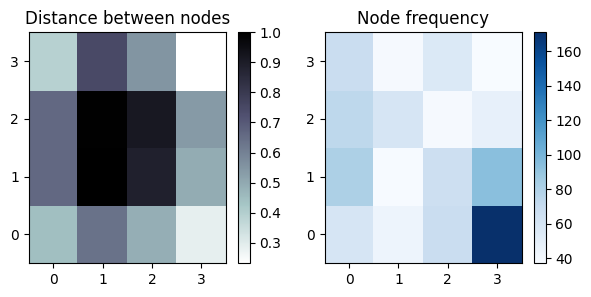

In [8]:
x = [x+0.5 for x in range(train_info['som_config']['x'])]
y = [y+0.5 for y in range(train_info['som_config']['y'])]

ax = plt.subplot(1, 2, 1)
ax.set_yticks(y, range(train_info['som_config']['y']))
ax.set_xticks(x, range(train_info['som_config']['x']))
ax.set_title("Distance between nodes")
mmp = ax.pcolor(trained_som.distance_map().T, cmap='bone_r')
plt.colorbar(mmp, ax=ax)

ax = plt.subplot(1, 2, 2)
ax.set_yticks(y, range(train_info['som_config']['y']))
ax.set_xticks(x, range(train_info['som_config']['x']))
ax.set_title("Node frequency")
mmp = ax.pcolor(trained_som.activation_response(train_info['som_train']['data']).T, cmap='Blues')
plt.colorbar(mmp, ax=ax)

## Running experiments

Change sigma to a high value and see how this changes the results

current model configuration
{'input_len': 12141, 'random_seed': 42, 'sigma': 10, 'x': 4, 'y': 4}
current training configuration
{'data': array([[-0.20764902, -0.23119393, -0.24361178, ..., -1.2395693 ,
        -1.2173333 , -1.1963109 ],
       [-1.4186287 , -1.4350127 , -1.4346281 , ..., -0.7765814 ,
        -0.82266665, -0.85507244],
       [ 0.2818422 ,  0.26017943,  0.24590352, ..., -1.4993271 ,
        -1.4546666 , -1.4071146 ],
       ...,
       [-0.3730332 , -0.36277893, -0.34284404, ..., -0.4535666 ,
        -0.40933332, -0.36363637],
       [-0.90616745, -0.8806073 , -0.84565145, ..., -0.22072679,
        -0.21466666, -0.20948617],
       [-0.7407833 , -0.7584541 , -0.7617738 , ..., -0.3230148 ,
        -0.33066666, -0.33465084]], dtype=float32),
 'num_iteration': 10000,
 'random_order': True,
 'verbose': True}
 [    84 / 10000 ]   1% - 0:00:22 left 

/home/z2034747/.local/lib/python3.9/site-packages/minisom.py:164: UserWarning: Warning: sigma might be too high for the dimension of the map.
  warn('Warning: sigma might be too high ' +


 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 63.39323476286982


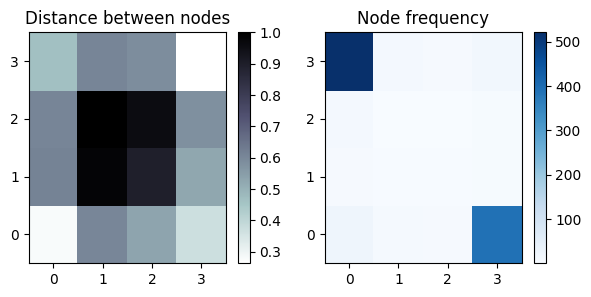

In [9]:
prefs = {'filename': "/home/scratch/ahaberlie1/som_example/hpa500_test.nc", 
         'var': 'z500', 'wlon': 220, 'elon': 305, 'nlat': 55, 'slat': 20, 
         'som_config': {'x': 4, 'y': 4, 'sigma': 10, 'random_seed': 42},
         'som_train': {'num_iteration': 10000, 'random_order': True, 'verbose': True}}

trained_som, trained_scaler, train_info, xr_data = train_som(prefs)


x = [x+0.5 for x in range(train_info['som_config']['x'])]
y = [y+0.5 for y in range(train_info['som_config']['y'])]

ax = plt.subplot(1, 2, 1)
ax.set_yticks(y, range(train_info['som_config']['y']))
ax.set_xticks(x, range(train_info['som_config']['x']))
ax.set_title("Distance between nodes")
mmp = ax.pcolor(trained_som.distance_map().T, cmap='bone_r')
plt.colorbar(mmp, ax=ax)

ax = plt.subplot(1, 2, 2)
ax.set_yticks(y, range(train_info['som_config']['y']))
ax.set_xticks(x, range(train_info['som_config']['x']))
ax.set_title("Node frequency")
mmp = ax.pcolor(trained_som.activation_response(train_info['som_train']['data']).T, cmap='Blues')
plt.colorbar(mmp, ax=ax)

Try changing sigma to a lower value

current model configuration
{'input_len': 12141, 'random_seed': 42, 'sigma': 0.1, 'x': 4, 'y': 4}
current training configuration
{'data': array([[-0.20764902, -0.23119393, -0.24361178, ..., -1.2395693 ,
        -1.2173333 , -1.1963109 ],
       [-1.4186287 , -1.4350127 , -1.4346281 , ..., -0.7765814 ,
        -0.82266665, -0.85507244],
       [ 0.2818422 ,  0.26017943,  0.24590352, ..., -1.4993271 ,
        -1.4546666 , -1.4071146 ],
       ...,
       [-0.3730332 , -0.36277893, -0.34284404, ..., -0.4535666 ,
        -0.40933332, -0.36363637],
       [-0.90616745, -0.8806073 , -0.84565145, ..., -0.22072679,
        -0.21466666, -0.20948617],
       [-0.7407833 , -0.7584541 , -0.7617738 , ..., -0.3230148 ,
        -0.33066666, -0.33465084]], dtype=float32),
 'num_iteration': 10000,
 'random_order': True,
 'verbose': True}
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 44.17400230827734


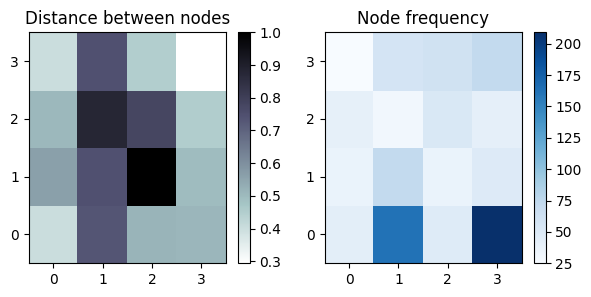

In [10]:
prefs = {'filename': "/home/scratch/ahaberlie1/som_example/hpa500_test.nc", 
         'var': 'z500', 'wlon': 220, 'elon': 305, 'nlat': 55, 'slat': 20, 
         'som_config': {'x': 4, 'y': 4, 'sigma': 0.1, 'random_seed': 42},
         'som_train': {'num_iteration': 10000, 'random_order': True, 'verbose': True}}

trained_som, trained_scaler, train_info, xr_data = train_som(prefs)


x = [x+0.5 for x in range(train_info['som_config']['x'])]
y = [y+0.5 for y in range(train_info['som_config']['y'])]

ax = plt.subplot(1, 2, 1)
ax.set_yticks(y, range(train_info['som_config']['y']))
ax.set_xticks(x, range(train_info['som_config']['x']))
ax.set_title("Distance between nodes")
mmp = ax.pcolor(trained_som.distance_map().T, cmap='bone_r')
plt.colorbar(mmp, ax=ax)

ax = plt.subplot(1, 2, 2)
ax.set_yticks(y, range(train_info['som_config']['y']))
ax.set_xticks(x, range(train_info['som_config']['x']))
ax.set_title("Node frequency")
mmp = ax.pcolor(trained_som.activation_response(train_info['som_train']['data']).T, cmap='Blues')
plt.colorbar(mmp, ax=ax)

Try changing the number of nodes

current model configuration
{'input_len': 12141, 'random_seed': 42, 'sigma': 5, 'x': 6, 'y': 8}
current training configuration
{'data': array([[-0.20764902, -0.23119393, -0.24361178, ..., -1.2395693 ,
        -1.2173333 , -1.1963109 ],
       [-1.4186287 , -1.4350127 , -1.4346281 , ..., -0.7765814 ,
        -0.82266665, -0.85507244],
       [ 0.2818422 ,  0.26017943,  0.24590352, ..., -1.4993271 ,
        -1.4546666 , -1.4071146 ],
       ...,
       [-0.3730332 , -0.36277893, -0.34284404, ..., -0.4535666 ,
        -0.40933332, -0.36363637],
       [-0.90616745, -0.8806073 , -0.84565145, ..., -0.22072679,
        -0.21466666, -0.20948617],
       [-0.7407833 , -0.7584541 , -0.7617738 , ..., -0.3230148 ,
        -0.33066666, -0.33465084]], dtype=float32),
 'num_iteration': 10000,
 'random_order': True,
 'verbose': True}
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 46.99179790686567


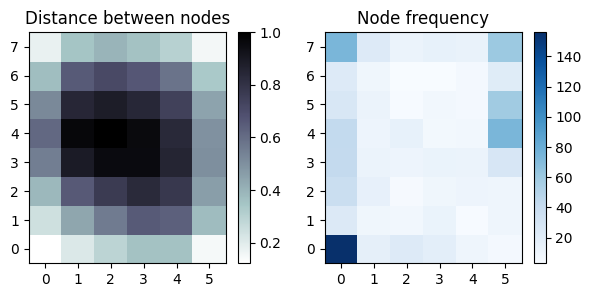

In [11]:
prefs = {'filename': "/home/scratch/ahaberlie1/som_example/hpa500_test.nc", 
         'var': 'z500', 'wlon': 220, 'elon': 305, 'nlat': 55, 'slat': 20, 
         'som_config': {'x': 6, 'y': 8, 'sigma': 5, 'random_seed': 42},
         'som_train': {'num_iteration': 10000, 'random_order': True, 'verbose': True}}

trained_som, trained_scaler, train_info, xr_data = train_som(prefs)


x = [x+0.5 for x in range(train_info['som_config']['x'])]
y = [y+0.5 for y in range(train_info['som_config']['y'])]

ax = plt.subplot(1, 2, 1)
ax.set_yticks(y, range(train_info['som_config']['y']))
ax.set_xticks(x, range(train_info['som_config']['x']))
ax.set_title("Distance between nodes")
mmp = ax.pcolor(trained_som.distance_map().T, cmap='bone_r')
plt.colorbar(mmp, ax=ax)

ax = plt.subplot(1, 2, 2)
ax.set_yticks(y, range(train_info['som_config']['y']))
ax.set_xticks(x, range(train_info['som_config']['x']))
ax.set_title("Node frequency")
mmp = ax.pcolor(trained_som.activation_response(train_info['som_train']['data']).T, cmap='Blues')
plt.colorbar(mmp, ax=ax)

## TODO: Visualize the "average" example per node

We can use the ```win_map``` function to get the node classification for each training data entry

In [12]:
win_map = trained_som.win_map(train_info['som_train']['data'])

win_map[(0,0)]

[array([0.62731135, 0.6199678 , 0.618311  , ..., 0.66621804, 0.66533333,
        0.6640316 ], dtype=float32),
 array([0.04134604, 0.0200138 , 0.00802108, ..., 0.33647376, 0.34266666,
        0.34123847], dtype=float32),
 array([0.9560124 , 0.93190706, 0.91302854, ..., 0.65679675, 0.67466664,
        0.68379444], dtype=float32),
 array([ 0.54094404,  0.5024155 ,  0.4711814 , ..., -0.1911171 ,
        -0.196     , -0.20685112], dtype=float32),
 array([-0.0020673 ,  0.02875546,  0.06096024, ...,  0.8936743 ,
         0.8946667 ,  0.88801056], dtype=float32),
 array([0.29677272, 0.2610996 , 0.23604904, ..., 0.48317632, 0.47866666,
        0.4743083 ], dtype=float32),
 array([0.51751465, 0.48010123, 0.45124328, ..., 0.49798116, 0.49066666,
        0.47299078], dtype=float32),
 array([0.9539451 , 0.9231654 , 0.895153  , ..., 0.25841185, 0.24933334,
        0.21475627], dtype=float32),
 array([0.731825  , 0.7168162 , 0.70975137, ..., 0.27860028, 0.28133333,
        0.27799737], dtype=float32)

In [13]:
xr_data

<xarray.Dataset>
Dimensions:  (time: 1043, lat: 71, lon: 171)
Coordinates:
  * time     (time) datetime64[ns] 2000-01-05 2000-01-12 ... 2019-12-25
  * lat      (lat) float32 55.0 54.5 54.0 53.5 53.0 ... 22.0 21.5 21.0 20.5 20.0
  * lon      (lon) float32 220.0 220.5 221.0 221.5 ... 303.5 304.0 304.5 305.0
Data variables:
    z500     (time, lat, lon) float32 5.424e+03 5.423e+03 ... 5.86e+03 5.859e+03
Attributes:
    title:         Customized GEFSv12 Reforecasts
    grid:          0.5 degree CONUS subset
    author:        Dr. Victor Gensini
    author_email:  vgensini@niu.edu

In [14]:
scaled_npy = train_info['som_train']['data']
np.shape(scaled_npy)
scaled_npy


array([[-0.20764902, -0.23119393, -0.24361178, ..., -1.2395693 ,
        -1.2173333 , -1.1963109 ],
       [-1.4186287 , -1.4350127 , -1.4346281 , ..., -0.7765814 ,
        -0.82266665, -0.85507244],
       [ 0.2818422 ,  0.26017943,  0.24590352, ..., -1.4993271 ,
        -1.4546666 , -1.4071146 ],
       ...,
       [-0.3730332 , -0.36277893, -0.34284404, ..., -0.4535666 ,
        -0.40933332, -0.36363637],
       [-0.90616745, -0.8806073 , -0.84565145, ..., -0.22072679,
        -0.21466666, -0.20948617],
       [-0.7407833 , -0.7584541 , -0.7617738 , ..., -0.3230148 ,
        -0.33066666, -0.33465084]], dtype=float32)

In [15]:
rescaled_npy = trained_scaler.inverse_transform(scaled_npy)
np.shape(rescaled_npy)

(1043, 12141)

In [16]:
rescaled_npy[0, :]

array([5424.375 , 5423.0625, 5421.9375, ..., 5818.1875, 5818.    ,
       5817.8125], dtype=float32)

In [17]:
print(win_map.keys())

dict_keys([(5, 4), (5, 5), (4, 7), (5, 7), (5, 6), (0, 7), (1, 7), (3, 7), (0, 6), (2, 4), (1, 4), (4, 2), (0, 3), (4, 0), (0, 1), (0, 2), (2, 0), (0, 0), (1, 0), (3, 0), (3, 2), (0, 4), (2, 3), (0, 5), (1, 5), (3, 5), (4, 3), (3, 1), (1, 3), (1, 1), (2, 2), (5, 1), (3, 3), (2, 5), (1, 2), (5, 3), (5, 2), (3, 6), (4, 4), (2, 7), (3, 4), (4, 5), (4, 6), (2, 1), (1, 6), (5, 0), (2, 6), (4, 1)])


In [18]:
example = trained_scaler.inverse_transform(win_map[(0,0)])

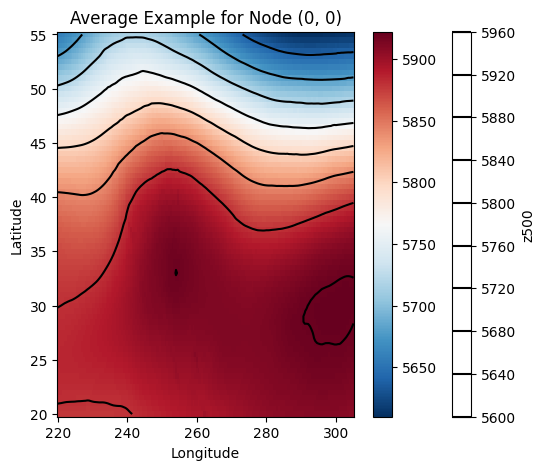

In [19]:
i = 0
j = 0

node = (i, j)

sample = win_map[node]

avg_scaled_sample =  np.mean(sample, axis= 0)

avg_rescaled_sample = trained_scaler.inverse_transform([avg_scaled_sample])[0]

avg_grid = np.reshape(avg_rescaled_sample, (len(xr_data.lat), len(xr_data.lon)))

plt.figure(figsize=(6,5))
cm = plt.pcolormesh(xr_data.lon, xr_data.lat, avg_grid, cmap="RdBu_r")
plt.contour(xr_data.lon, xr_data.lat, avg_grid, colors= 'k')
plt.colorbar(label=prefs['var'])
plt.title(f"Average Example for Node ({i}, {j})")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.colorbar(cm)
plt.show()

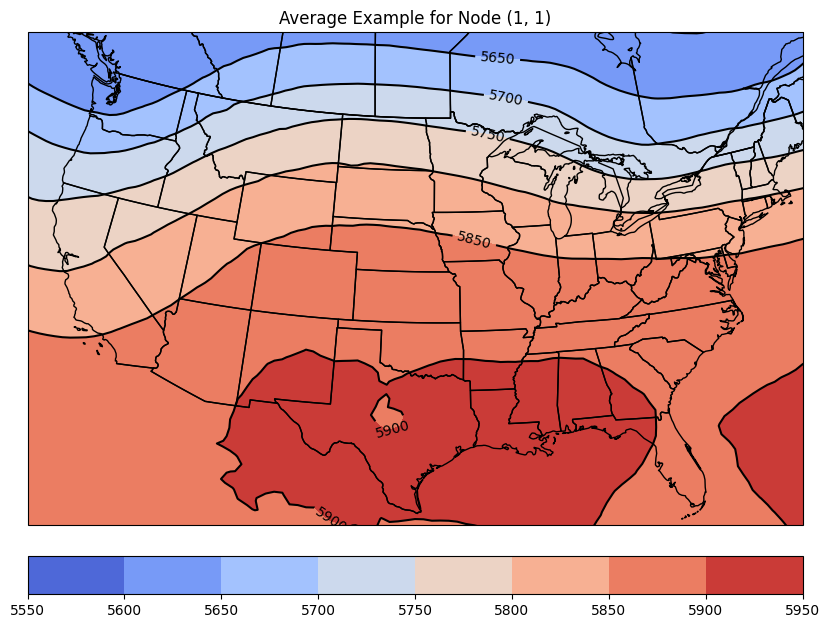

In [20]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature


i = 1
j = 1

node = (i, j)

sample = win_map[node]

avg_scaled_sample =  np.mean(sample, axis= 0)

avg_rescaled_sample = trained_scaler.inverse_transform([avg_scaled_sample])[0]

avg_grid = np.reshape(avg_rescaled_sample, (len(xr_data.lat), len(xr_data.lon)))

plt.figure(figsize=(10,8))
ax = plt.subplot(1, 1, 1, projection= ccrs.LambertConformal())

ax.set_extent([xr_data.lon.values.min() - 340, xr_data.lon.values.max() - 380, xr_data.lat.values.min() + 3, xr_data.lat.values.max() - 3])
ax.add_feature(cfeature.BORDERS)
ax.add_feature(cfeature.STATES)

cf = ax.contourf(xr_data.lon, xr_data.lat, avg_grid, cmap="coolwarm", transform= ccrs.PlateCarree())
cn = ax.contour(xr_data.lon, xr_data.lat, avg_grid, colors= 'k', transform= ccrs.PlateCarree())
ax.clabel(cn)




plt.title(f"Average Example for Node ({i}, {j})")
plt.xlabel("Longitude")
plt.ylabel("Latitude")

ax.set_aspect('auto')
plt.colorbar(cf, ax= ax, orientation= 'horizontal', pad= 0.05)
plt.show()

In [21]:
import math
length, width = prefs['som_config']['x'], prefs['som_config']['y']


avg_data = [np.reshape(trained_scaler.inverse_transform([np.mean(win_map[node], axis=0)])[0],(len(xr_data.lat), len(xr_data.lon)))for node in sorted(win_map.keys())]
node_keys = sorted(win_map.keys())


In [22]:
i = sorted(win_map.keys())
i[0]

(0, 0)

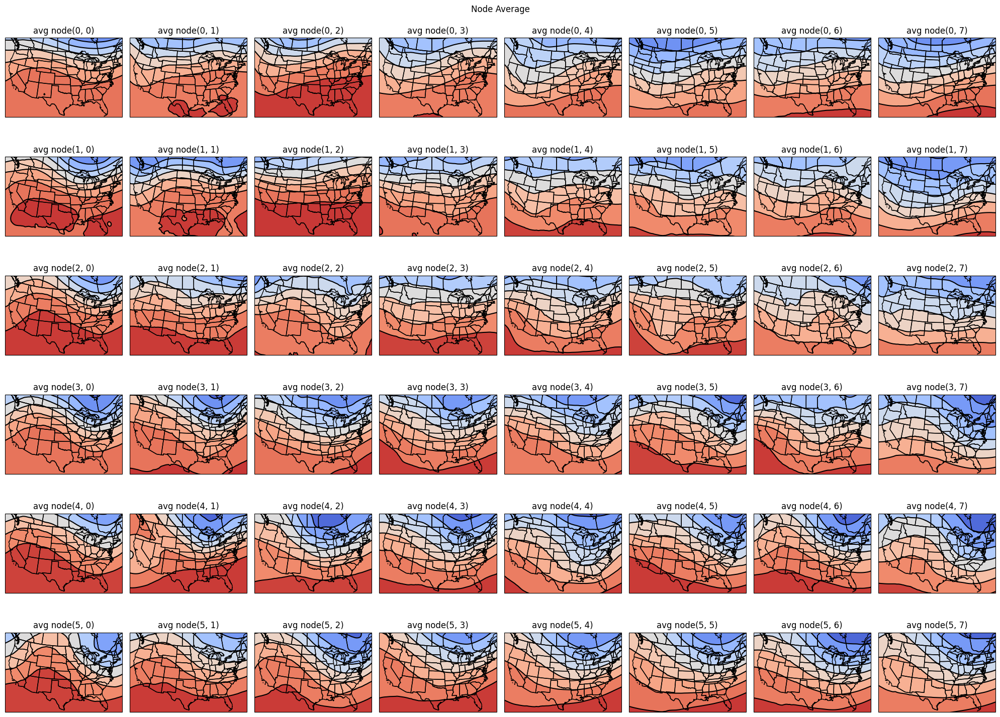

In [23]:
# levels = np.arange(5000, 6000, 50)
# levels= levels,
# vmin= 5000, vmax= 6000,

length, width = prefs['som_config']['x'], prefs['som_config']['y']
plt.figure(figsize= (20, 15))
for i in range(len(avg_data)):
    ax = plt.subplot(length, width, i + 1, projection= ccrs.LambertConformal())
    ax.set_extent([xr_data.lon.values.min() - 340, xr_data.lon.values.max() - 380, xr_data.lat.values.min() + 3, xr_data.lat.values.max() - 3])
    ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.STATES)

    cf = ax.contourf(xr_data.lon, xr_data.lat, avg_data[i],  cmap="coolwarm",  transform= ccrs.PlateCarree())
    cn = ax.contour(xr_data.lon, xr_data.lat, avg_data[i], colors= 'k', transform= ccrs.PlateCarree())

    ax.set_title(f'avg node{node_keys[i]}')

    
plt.suptitle('Node Average')
plt.tight_layout()

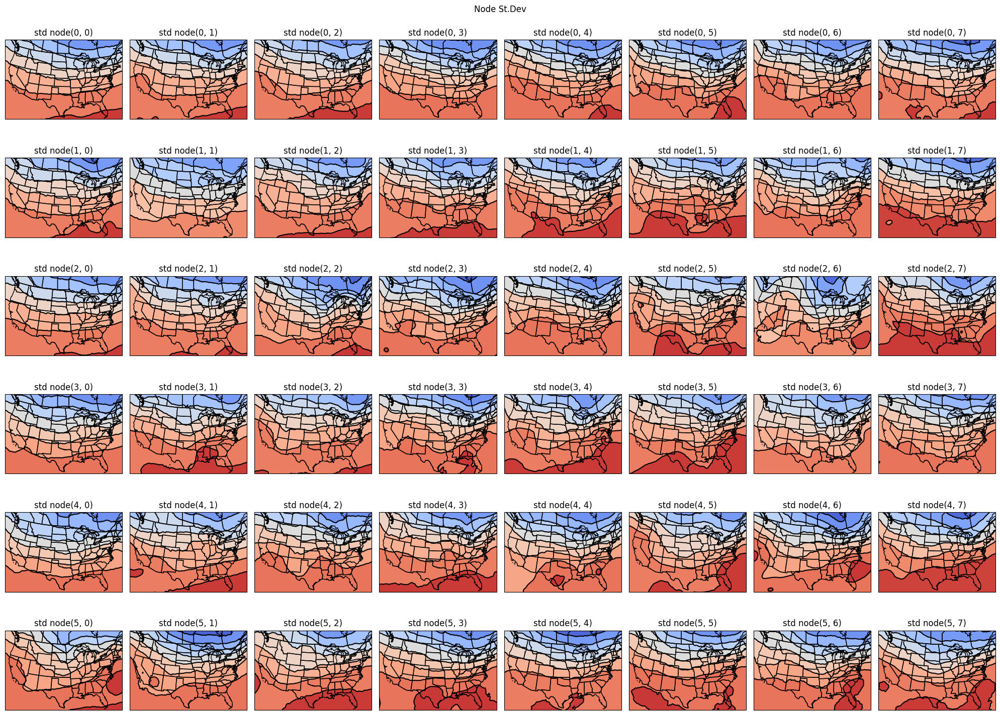

In [24]:
std_data = [np.reshape(trained_scaler.inverse_transform([np.std(win_map[node], axis=0)])[0],(len(xr_data.lat), len(xr_data.lon)))for node in sorted(win_map.keys())]
std_keys = sorted(win_map.keys())

fig = plt.figure(figsize= (20, 15))
for i in range(len(std_data)):
    ax = plt.subplot(length, width, i + 1, projection= ccrs.LambertConformal())
    ax.set_extent([xr_data.lon.values.min() - 340, xr_data.lon.values.max() - 380, xr_data.lat.values.min() + 3, xr_data.lat.values.max() - 3])
    ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.STATES)

    cf = ax.contourf(xr_data.lon, xr_data.lat, std_data[i], cmap="coolwarm", transform= ccrs.PlateCarree())
    cn = ax.contour(xr_data.lon, xr_data.lat, std_data[i], colors= 'k', transform= ccrs.PlateCarree())

    ax.set_title(f'std node{std_keys[i]}')

fig.subplots_adjust(hspace= 0.3, wspace= 0.5)
    
plt.suptitle('Node St.Dev')
plt.tight_layout()

# Separating Dataset by season: 
## Winter = D,J,F Spring= M,A,M Summer= J,J,A Fall= S,O,N


In [25]:
# import pandas as pd
# dataset= xr.open_dataset('/home/z2034747/Research/hpa500_test.nc')
# dataset

In [26]:
# season_labels = []
# for t in dataset.time:
#     # print(t.dt.month.values)
#     if t.dt.month.values in [1, 2, 12]:
#         season_labels.append('winter')
#     elif t.dt.month.values in [3, 4, 5]:
#         season_labels.append('spring')
#     elif t.dt.month.values in [6, 7, 8]:
#         season_labels.append('summer')
#     else:
#         season_labels.append('fall')



In [27]:
# np.shape(dataset.time)

In [28]:
# dataset = dataset.assign_coords(season=("time", dataset['time'].dt))

In [29]:
# da_season = xr.DataArray(season_labels, dims= ('time'), coords= {'time': dataset.time})



In [30]:
# dataset['season'] = da_season
# dataset

In [31]:
# winter_dataset = new_dataset.where(dataset['season'] == 'winter',drop= True)
# spring_dataset = new_dataset.where(dataset['season'] == 'spring', drop= True)
# summer_dataset = new_dataset.where(dataset['season'] == 'summer', drop= True)
# fall_dataset = new_dataset.where(dataset['season'] == 'fall', drop= True)

In [32]:
# summer_dataset

In [33]:
# winter_dataset.to_netcdf('winter_hpa500.nc')
# spring_dataset.to_netcdf('spring_hpa500.nc')
# summer_dataset.to_netcdf('summer_hpa500.nc')
# fall_dataset.to_netcdf('fall_hpa500.nc')

In [62]:
ds_spring = xr.open_dataset('spring_hpa500.nc')

In [63]:
ds_spring

<xarray.Dataset>
Dimensions:  (time: 263, lat: 71, lon: 171)
Coordinates:
  * time     (time) datetime64[ns] 2000-03-01 2000-03-08 ... 2019-05-29
  * lat      (lat) float32 55.0 54.5 54.0 53.5 53.0 ... 22.0 21.5 21.0 20.5 20.0
  * lon      (lon) float32 220.0 220.5 221.0 221.5 ... 303.5 304.0 304.5 305.0
Data variables:
    z500     (time, lat, lon) float32 ...
Attributes:
    title:         Customized GEFSv12 Reforecasts
    grid:          0.5 degree CONUS subset
    author:        Dr. Victor Gensini
    author_email:  vgensini@niu.edu

# NEW STUFF: 


## SPRING:

In [129]:
spr_prefs = {'filename': "/home/z2034747/Research/spring_hpa500.nc", 
         'var': 'z500', 'wlon': 220, 'elon': 305, 'nlat': 55, 'slat': 20, 
         'som_config': {'x': 4, 'y': 4, 'sigma': 1, 'random_seed': 42},
         'som_train': {'num_iteration': 10000, 'random_order': True, 'verbose': True}}

spr_trained_som, spr_trained_scaler, spr_train_info, spr_xr_data = train_som(spr_prefs)

current model configuration
{'input_len': 12141, 'random_seed': 42, 'sigma': 1, 'x': 4, 'y': 4}
current training configuration
{'data': array([[-0.7133169 , -0.71357095, -0.6909831 , ..., -1.5154976 ,
        -1.4834437 , -1.4086814 ],
       [-0.04408138, -0.08786742, -0.11646838, ..., -1.6378467 ,
        -1.6556292 , -1.6380017 ],
       [-0.02620222, -0.02470294, -0.01127113, ..., -0.2675367 ,
        -0.28476822, -0.2981163 ],
       ...,
       [ 0.        , -0.01438399, -0.01252348, ..., -0.48450243,
        -0.49172187, -0.45372644],
       [ 0.9737978 ,  0.97467166,  0.9799624 , ...,  0.3882545 ,
         0.39403972,  0.38493037],
       [ 1.0157213 ,  1.0171982 ,  1.0190983 , ...,  0.10603589,
         0.13245033,  0.16380017]], dtype=float32),
 'num_iteration': 10000,
 'random_order': True,
 'verbose': True}
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 59.51475933085525


In [130]:
spr_win_map = spr_trained_som.win_map(spr_train_info['som_train']['data'])
spr_avg_data = [np.reshape(spr_trained_scaler.inverse_transform([np.mean(spr_win_map[node], axis=0)])[0],(len(spr_xr_data.lat), len(spr_xr_data.lon)))for node in sorted(spr_win_map.keys())]
spr_node_keys = sorted(spr_win_map.keys())

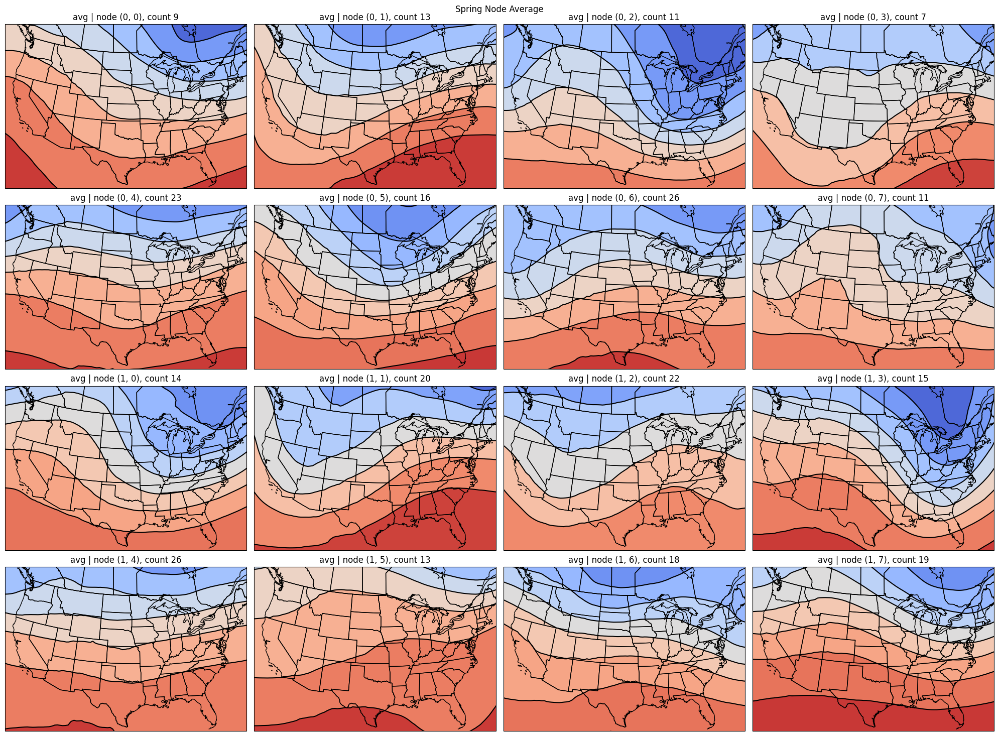

In [131]:
spr_length, spr_width = spr_prefs['som_config']['x'], spr_prefs['som_config']['y']
spr_frequencies = spr_trained_som.activation_response(spr_train_info['som_train']['data']).flatten()

plt.figure(figsize= (20, 15))
for i in range(len(spr_avg_data)):
    ax = plt.subplot(spr_length, spr_width, i + 1, projection= ccrs.LambertConformal())
    ax.set_extent([spr_xr_data.lon.values.min() - 340, spr_xr_data.lon.values.max() - 380, spr_xr_data.lat.values.min() + 3, spr_xr_data.lat.values.max() - 3])
    ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.STATES)

    cf = ax.contourf(spr_xr_data.lon, spr_xr_data.lat, spr_avg_data[i],  cmap="coolwarm",  transform= ccrs.PlateCarree())
    cn = ax.contour(spr_xr_data.lon, spr_xr_data.lat, spr_avg_data[i], colors= 'k', transform= ccrs.PlateCarree())

    ax.set_title(f'avg | node {node_keys[i]}, count {int(spr_frequencies[i])}')

    
plt.suptitle('Spring Node Average')
plt.tight_layout()

## SUMMER:

In [132]:
sum_prefs = {'filename': "/home/z2034747/Research/summer_hpa500.nc", 
         'var': 'z500', 'wlon': 220, 'elon': 305, 'nlat': 55, 'slat': 20, 
         'som_config': {'x': 4, 'y': 4, 'sigma': 1, 'random_seed': 42},
         'som_train': {'num_iteration': 10000, 'random_order': True, 'verbose': True}}

sum_trained_som, sum_trained_scaler, sum_train_info, sum_xr_data = train_som(sum_prefs)

current model configuration
{'input_len': 12141, 'random_seed': 42, 'sigma': 1, 'x': 4, 'y': 4}
current training configuration
{'data': array([[-0.4111816 , -0.42591125, -0.4210117 , ..., -1.530827  ,
        -1.4657143 , -1.440225  ],
       [-0.8858049 , -0.8656894 , -0.8245136 , ..., -1.7293233 ,
        -1.5885714 , -1.5105485 ],
       [-0.8441713 , -0.8363708 , -0.8       , ...,  0.2225564 ,
         0.22857143,  0.2644163 ],
       ...,
       [ 1.1245043 ,  1.0899366 ,  1.0505836 , ...,  1.1157895 ,
         1.0714285 ,  1.0829817 ],
       [-0.68001586, -0.7254358 , -0.74941635, ...,  0.4180451 ,
         0.4       ,  0.40225035],
       [ 0.17605075,  0.16521394,  0.16420233, ..., -0.15639098,
        -0.17428571, -0.18002813]], dtype=float32),
 'num_iteration': 10000,
 'random_order': True,
 'verbose': True}
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 62.59690474623715


In [133]:
sum_win_map = sum_trained_som.win_map(sum_train_info['som_train']['data'])
sum_avg_data = [np.reshape(sum_trained_scaler.inverse_transform([np.mean(sum_win_map[node], axis=0)])[0],(len(sum_xr_data.lat), len(sum_xr_data.lon)))for node in sorted(sum_win_map.keys())]
sum_node_keys = sorted(sum_win_map.keys())

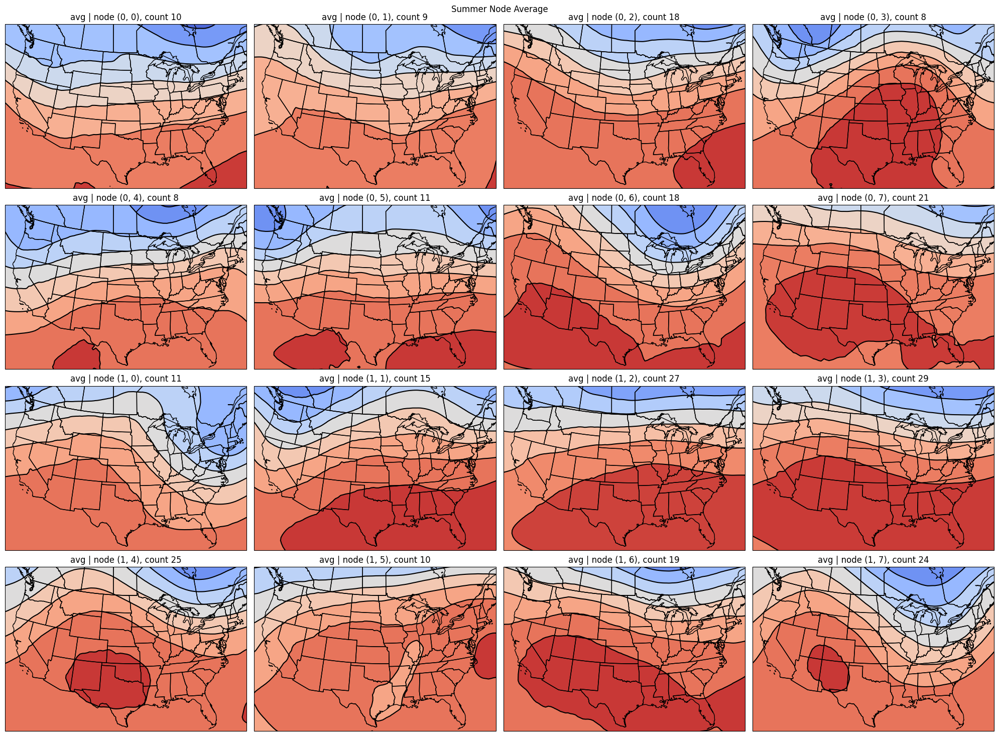

In [134]:
sum_length, sum_width = sum_prefs['som_config']['x'], sum_prefs['som_config']['y']
sum_frequencies = sum_trained_som.activation_response(sum_train_info['som_train']['data']).flatten()

plt.figure(figsize= (20, 15))
for i in range(len(sum_avg_data)):
    ax = plt.subplot(sum_length, sum_width, i + 1, projection= ccrs.LambertConformal())
    ax.set_extent([sum_xr_data.lon.values.min() - 340, sum_xr_data.lon.values.max() - 380, sum_xr_data.lat.values.min() + 3, sum_xr_data.lat.values.max() - 3])
    ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.STATES)

    cf = ax.contourf(sum_xr_data.lon, sum_xr_data.lat, sum_avg_data[i],  cmap="coolwarm",  transform= ccrs.PlateCarree())
    cn = ax.contour(sum_xr_data.lon, sum_xr_data.lat, sum_avg_data[i], colors= 'k', transform= ccrs.PlateCarree())

    ax.set_title(f'avg | node {node_keys[i]}, count {int(sum_frequencies[i])}')

    
plt.suptitle('Summer Node Average')
plt.tight_layout()

# FALL:

In [135]:
fall_prefs = {'filename': "/home/z2034747/Research/fall_hpa500.nc", 
         'var': 'z500', 'wlon': 220, 'elon': 305, 'nlat': 55, 'slat': 20, 
         'som_config': {'x': 4, 'y': 4, 'sigma': 1, 'random_seed': 42},
         'som_train': {'num_iteration': 10000, 'random_order': True, 'verbose': True}}

fall_trained_som, fall_trained_scaler, fall_train_info, fall_xr_data = train_som(fall_prefs)

current model configuration
{'input_len': 12141, 'random_seed': 42, 'sigma': 1, 'x': 4, 'y': 4}
current training configuration
{'data': array([[ 0.70035714,  0.69519734,  0.7076314 , ...,  0.57894737,
         0.5494708 ,  0.5502932 ],
       [ 0.19654761,  0.17784119,  0.17456988, ...,  0.21883656,
         0.17579383,  0.16238159],
       [ 0.90011907,  0.8649548 ,  0.84910977, ..., -0.2299169 ,
        -0.2678325 , -0.27244022],
       ...,
       [ 0.17845239,  0.1514503 ,  0.13548349, ..., -1.092336  ,
        -1.1366774 , -1.0951737 ],
       [ 0.510119  ,  0.49048978,  0.48774055, ..., -0.08033241,
        -0.07455131, -0.03067208],
       [ 0.40511906,  0.32786494,  0.2618548 , ...,  0.27423823,
         0.25678784,  0.26883176]], dtype=float32),
 'num_iteration': 10000,
 'random_order': True,
 'verbose': True}
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 58.62300884852834


In [136]:
fall_win_map = fall_trained_som.win_map(fall_train_info['som_train']['data'])
fall_avg_data = [np.reshape(fall_trained_scaler.inverse_transform([np.mean(fall_win_map[node], axis=0)])[0],(len(fall_xr_data.lat), len(fall_xr_data.lon)))for node in sorted(fall_win_map.keys())]
fall_node_keys = sorted(fall_win_map.keys())

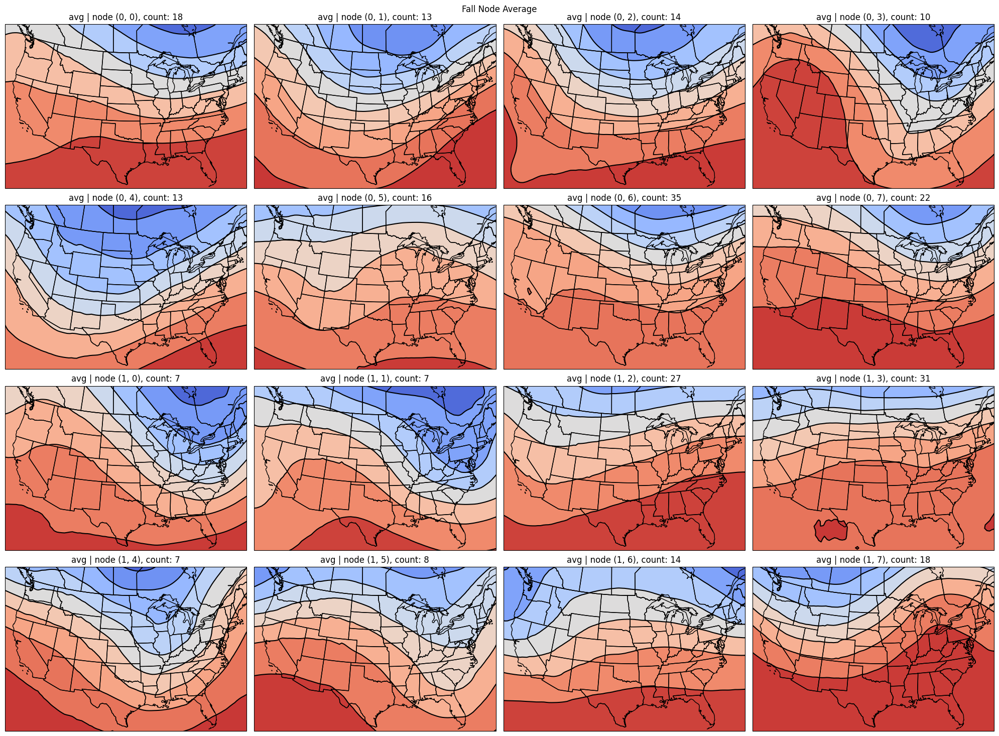

In [137]:
fall_length, fall_width = fall_prefs['som_config']['x'], fall_prefs['som_config']['y']
fall_frequencies = fall_trained_som.activation_response(fall_train_info['som_train']['data']).flatten()

plt.figure(figsize= (20, 15))
for i in range(len(fall_avg_data)):
    ax = plt.subplot(fall_length, fall_width, i + 1, projection= ccrs.LambertConformal())
    ax.set_extent([fall_xr_data.lon.values.min() - 340, fall_xr_data.lon.values.max() - 380, fall_xr_data.lat.values.min() + 3, fall_xr_data.lat.values.max() - 3])
    ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.STATES)

    cf = ax.contourf(fall_xr_data.lon, fall_xr_data.lat, fall_avg_data[i],  cmap="coolwarm",  transform= ccrs.PlateCarree())
    cn = ax.contour(fall_xr_data.lon, fall_xr_data.lat, fall_avg_data[i], colors= 'k', transform= ccrs.PlateCarree())

    ax.set_title(f'avg | node {node_keys[i]}, count: {int(fall_frequencies[i])}')

    
plt.suptitle('Fall Node Average')

plt.savefig('Fall_avg.png', dpi= 300, bbox_inches= 'tight')

plt.tight_layout()

In [197]:
wint_prefs = {'filename': "/home/z2034747/Research/winter_hpa500.nc", 
         'var': 'z500', 'wlon': 220, 'elon': 305, 'nlat': 55, 'slat': 20, 
         'som_config': {'x': 4, 'y': 4, 'sigma': 1, 'random_seed': 42},
         'som_train': {'num_iteration': 10000, 'random_order': True, 'verbose': True}}

wint_trained_som, wint_trained_scaler, wint_train_info, wint_xr_data = train_som(wint_prefs)

current model configuration
{'input_len': 12141, 'random_seed': 42, 'sigma': 1, 'x': 4, 'y': 4}
current training configuration
{'data': array([[ 0.2205953 ,  0.20261754,  0.18475358, ..., -0.9039634 ,
        -0.89879155, -0.881997  ],
       [-1.0448872 , -1.0656811 , -1.0769604 , ..., -0.37957317,
        -0.45166162, -0.49016643],
       [ 0.7321171 ,  0.7203102 ,  0.70332605, ..., -1.1981708 ,
        -1.1676737 , -1.1240544 ],
       ...,
       [ 0.04776764,  0.06398449,  0.07963098, ..., -0.01371951,
         0.01661631,  0.0741301 ],
       [-0.5093615 , -0.48158023, -0.45302257, ...,  0.25      ,
         0.23716012,  0.25113463],
       [-0.33653384, -0.35288414, -0.36416605, ...,  0.13414635,
         0.10574018,  0.10741301]], dtype=float32),
 'num_iteration': 10000,
 'random_order': True,
 'verbose': True}
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 61.316854732425085


In [198]:
wint_win_map = wint_trained_som.win_map(wint_train_info['som_train']['data'])
wint_avg_data = [np.reshape(wint_trained_scaler.inverse_transform([np.mean(wint_win_map[node], axis=0)])[0],(len(wint_xr_data.lat), len(wint_xr_data.lon)))for node in sorted(wint_win_map.keys())]
wint_node_keys = sorted(wint_win_map.keys())

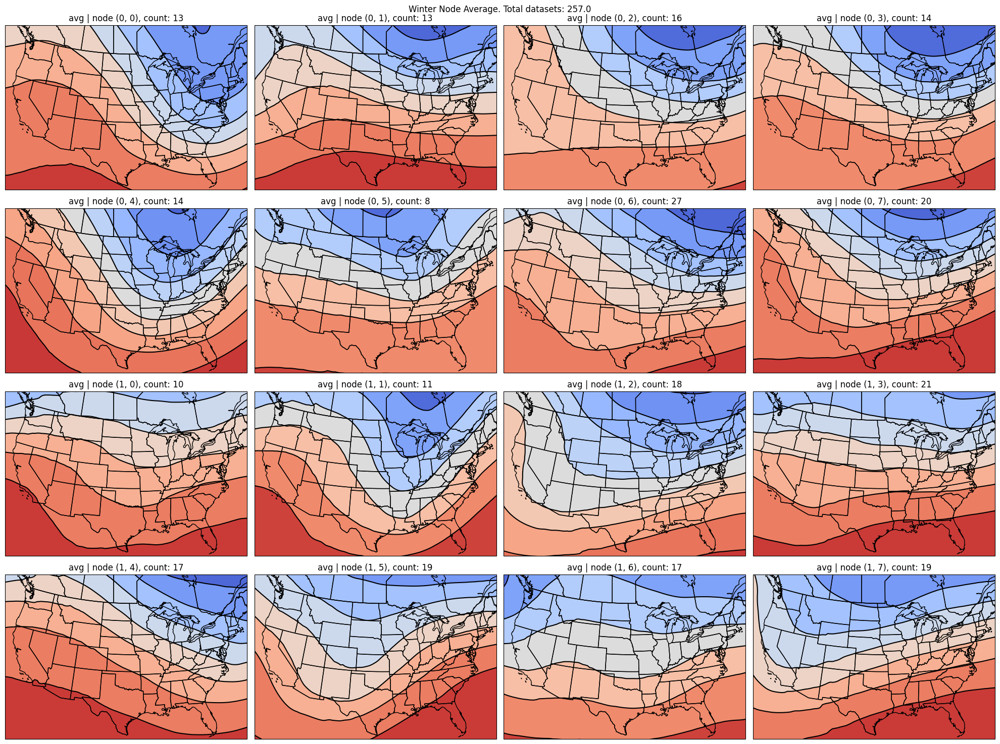

In [199]:
wint_length, wint_width = wint_prefs['som_config']['x'], wint_prefs['som_config']['y']
wint_frequencies = wint_trained_som.activation_response(wint_train_info['som_train']['data']).flatten()

plt.figure(figsize= (20, 15))
for i in range(len(wint_avg_data)):
    ax = plt.subplot(wint_length, wint_width, i + 1, projection= ccrs.LambertConformal())
    ax.set_extent([wint_xr_data.lon.values.min() - 340, wint_xr_data.lon.values.max() - 380, wint_xr_data.lat.values.min() + 3, wint_xr_data.lat.values.max() - 3])
    ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.STATES)

    cf = ax.contourf(wint_xr_data.lon, wint_xr_data.lat, wint_avg_data[i],  cmap="coolwarm",  transform= ccrs.PlateCarree())
    cn = ax.contour(wint_xr_data.lon, wint_xr_data.lat, wint_avg_data[i], colors= 'k', transform= ccrs.PlateCarree())

    ax.set_title(f'avg | node {node_keys[i]}, count: {int(wint_frequencies[i])}')

    
plt.suptitle(f'Winter Node Average. Total datasets: {wint_frequencies.sum()}')

plt.subplots_adjust(hspace= 0.4)

plt.savefig('winter_avg.png', dpi= 300, bbox_inches= 'tight')

plt.tight_layout()

# Final plots?

In [224]:
prefs = {'filename': "/home/z2034747/Research/fall_hpa500.nc", 
         'var': 'z500', 'wlon': 220, 'elon': 305, 'nlat': 55, 'slat': 20, 
         'som_config': {'x': 4, 'y': 4, 'sigma': 0.25, 'random_seed': 42},
         'som_train': {'num_iteration': 10000, 'random_order': True, 'verbose': True}}

trained_som, trained_scaler, train_info, xr_data = train_som(prefs)

win_map = trained_som.win_map(train_info['som_train']['data'])
avg_data = [np.reshape(trained_scaler.inverse_transform([np.mean(win_map[node], axis=0)])[0],(len(xr_data.lat), len(xr_data.lon)))for node in sorted(win_map.keys())]
node_keys = sorted(win_map.keys())

length, width = prefs['som_config']['x'], prefs['som_config']['y']
frequencies = trained_som.activation_response(train_info['som_train']['data']).flatten()

current model configuration
{'input_len': 12141, 'random_seed': 42, 'sigma': 0.25, 'x': 4, 'y': 4}
current training configuration
{'data': array([[ 0.70035714,  0.69519734,  0.7076314 , ...,  0.57894737,
         0.5494708 ,  0.5502932 ],
       [ 0.19654761,  0.17784119,  0.17456988, ...,  0.21883656,
         0.17579383,  0.16238159],
       [ 0.90011907,  0.8649548 ,  0.84910977, ..., -0.2299169 ,
        -0.2678325 , -0.27244022],
       ...,
       [ 0.17845239,  0.1514503 ,  0.13548349, ..., -1.092336  ,
        -1.1366774 , -1.0951737 ],
       [ 0.510119  ,  0.49048978,  0.48774055, ..., -0.08033241,
        -0.07455131, -0.03067208],
       [ 0.40511906,  0.32786494,  0.2618548 , ...,  0.27423823,
         0.25678784,  0.26883176]], dtype=float32),
 'num_iteration': 10000,
 'random_order': True,
 'verbose': True}
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 57.947512949804654


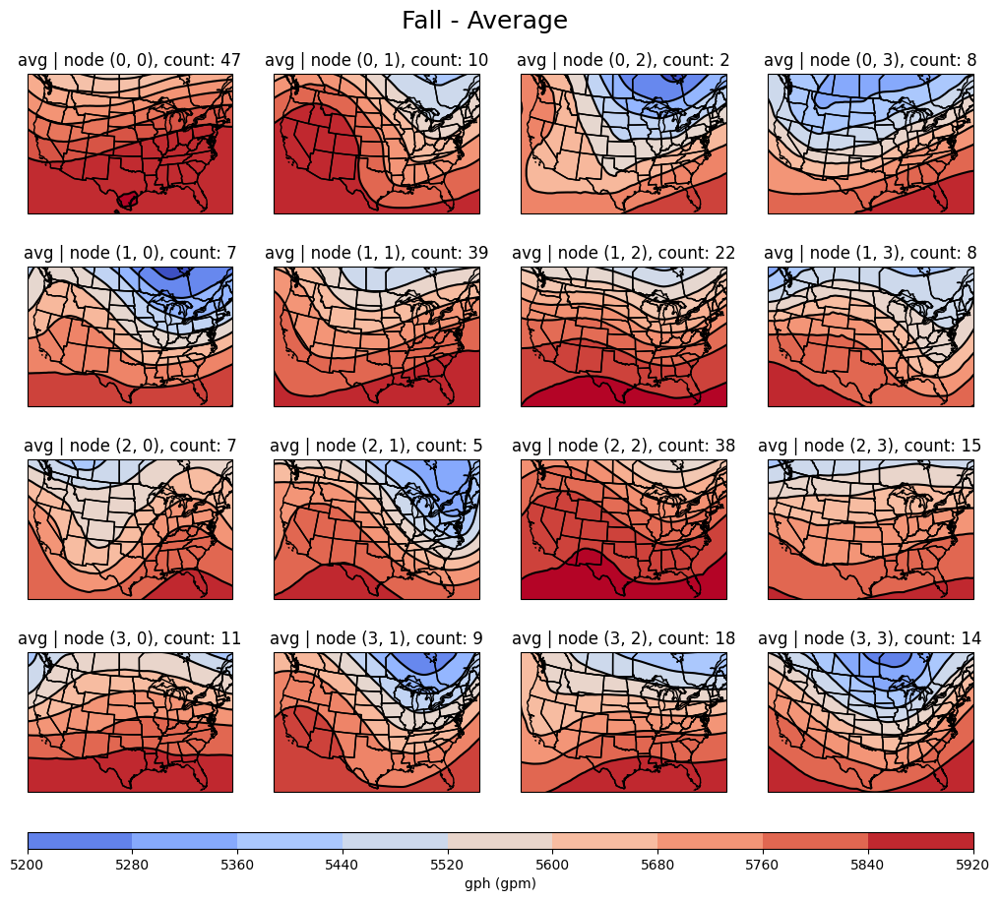

In [219]:
gs = GridSpec(nrows= length + 1, ncols= width, height_ratios=[1]*length + [0.1])
fig = plt.figure(figsize=(3.1 * length, 2.6 * width))

# levels = np.arange(np.min(avg_data), np.max(avg_data),
                   # (np.max(avg_data) - np.min(avg_data) / 10))

ax = [fig.add_subplot(gs[(x // length, x % width)], projection=ccrs.LambertConformal())
      for x in range(len(avg_data))]

# vmin = np.min(avg_data) - 20
# vmax = np.max(avg_data) + 20

vmin = np.min(avg_data)
vmax = np.max(avg_data)
norm = mcolors.Normalize(vmin=vmin, vmax=vmax)


for i, data in enumerate(avg_data):
    ax[i].set_extent([xr_data.lon.values.min() - 340, xr_data.lon.values.max() - 380,
                      xr_data.lat.values.min() + 3, xr_data.lat.values.max() - 3])
    ax[i].add_feature(cfeature.BORDERS)
    ax[i].add_feature(cfeature.STATES)
    
    cf = ax[i].contourf(xr_data.lon, xr_data.lat, avg_data[i], cmap='coolwarm', norm= norm, transform=ccrs.PlateCarree())
    cn = ax[i].contour(xr_data.lon, xr_data.lat, avg_data[i],  colors='k', transform=ccrs.PlateCarree())
    # ax[i].clabel(cn, inline=True)
    ax[i].set_title(f'avg | node {node_keys[i]}, count: {int(frequencies[i])}')
    
cax = fig.add_subplot(gs[-1, :])    
fig.colorbar(cf, cax=cax, label='gph (gpm)', orientation='horizontal', aspect=0.8)

plt.suptitle('Fall - Average', fontsize=18, y=0.93)

# plt.savefig('Fall_Average.png', bbox_inches='tight')
# plt.tight_layout(pad=0.2, w_pad=0.5, h_pad=0.2)
plt.show()


In [134]:
ds = xr.open_dataset('spring_hpa500.nc')
ds

<xarray.Dataset>
Dimensions:  (time: 263, lat: 71, lon: 171)
Coordinates:
  * time     (time) datetime64[ns] 2000-03-01 2000-03-08 ... 2019-05-29
  * lat      (lat) float32 55.0 54.5 54.0 53.5 53.0 ... 22.0 21.5 21.0 20.5 20.0
  * lon      (lon) float32 220.0 220.5 221.0 221.5 ... 303.5 304.0 304.5 305.0
Data variables:
    z500     (time, lat, lon) float32 ...
Attributes:
    title:         Customized GEFSv12 Reforecasts
    grid:          0.5 degree CONUS subset
    author:        Dr. Victor Gensini
    author_email:  vgensini@niu.edu

In [135]:
ds['rolling'] = ds.z500.rolling(time= 3, center= True).mean()
ds['std'] = ds.z500.rolling(time= 3, center= True).std()

In [68]:
ds.dropna('time')

<xarray.Dataset>
Dimensions:  (time: 261, lat: 71, lon: 171)
Coordinates:
  * time     (time) datetime64[ns] 2000-03-08 2000-03-15 ... 2019-05-22
  * lat      (lat) float32 55.0 54.5 54.0 53.5 53.0 ... 22.0 21.5 21.0 20.5 20.0
  * lon      (lon) float32 220.0 220.5 221.0 221.5 ... 303.5 304.0 304.5 305.0
Data variables:
    z500     (time, lat, lon) float32 5.393e+03 5.39e+03 ... 5.874e+03 5.873e+03
    rolling  (time, lat, lon) float32 5.349e+03 5.353e+03 ... 5.859e+03 5.86e+03
    std      (time, lat, lon) float32 64.84 62.14 59.63 ... 13.94 14.03 13.54
Attributes:
    title:         Customized GEFSv12 Reforecasts
    grid:          0.5 degree CONUS subset
    author:        Dr. Victor Gensini
    author_email:  vgensini@niu.edu

In [77]:
apr_27 = ds.sel(time= '2011-04-27')

apr_27

<xarray.Dataset>
Dimensions:  (lat: 71, lon: 171)
Coordinates:
    time     datetime64[ns] 2011-04-27
  * lat      (lat) float32 55.0 54.5 54.0 53.5 53.0 ... 22.0 21.5 21.0 20.5 20.0
  * lon      (lon) float32 220.0 220.5 221.0 221.5 ... 303.5 304.0 304.5 305.0
Data variables:
    z500     (lat, lon) float32 5.338e+03 5.341e+03 ... 5.856e+03 5.855e+03
    rolling  (lat, lon) float32 5.42e+03 5.42e+03 ... 5.845e+03 5.845e+03
    std      (lat, lon) float32 62.81 63.03 63.45 64.05 ... 11.55 11.1 10.4
Attributes:
    title:         Customized GEFSv12 Reforecasts
    grid:          0.5 degree CONUS subset
    author:        Dr. Victor Gensini
    author_email:  vgensini@niu.edu

In [86]:
std_anomaly = (apr_27.z500.values - apr_27['rolling'].values) / apr_27['std'].values

In [6]:
ds = xr.open_dataset('hpa500_test.nc')
ds['rolling'] = ds.z500.rolling(time= 3, center= True).mean()
ds['std'] = ds.z500.rolling(time= 3, center= True).std('time')
ds['standard_anomaly'] =  (ds['z500'] - ds['rolling']) / ds['std']
ds['standard_anomaly'].attrs['units'] = 'sigma'
ds['std'].attrs['units'] = 'gpm'
ds = ds.dropna('time')

In [158]:
ds

<xarray.Dataset>
Dimensions:           (time: 256, lat: 71, lon: 171)
Coordinates:
  * time              (time) datetime64[ns] 2000-03-08 2000-03-15 ... 2019-05-22
  * lat               (lat) float32 55.0 54.5 54.0 53.5 ... 21.5 21.0 20.5 20.0
  * lon               (lon) float32 220.0 220.5 221.0 ... 304.0 304.5 305.0
Data variables:
    z500              (time, lat, lon) float32 5.393e+03 5.39e+03 ... 5.873e+03
    rolling           (time, lat, lon) float32 5.349e+03 5.353e+03 ... 5.86e+03
    std               (time, lat, lon) float32 64.84 62.14 59.63 ... 14.03 13.54
    standard_anomaly  (time, lat, lon) float32 0.679 0.6031 ... 1.029 0.9953
Attributes:
    title:         Customized GEFSv12 Reforecasts
    grid:          0.5 degree CONUS subset
    author:        Dr. Victor Gensini
    author_email:  vgensini@niu.edu

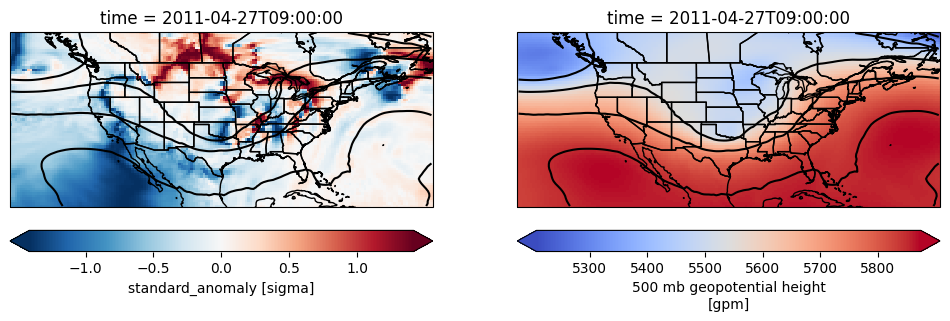

In [84]:
time= '2011-04-27'

fig= plt.figure(figsize= (12, 6))
ax= plt.subplot(1, 2, 1, projection= ccrs.PlateCarree())
ds['standard_anomaly'][0].sel(time= time, method= 'nearest').plot.pcolormesh(ax= ax, transform= ccrs.PlateCarree(), cbar_kwargs= {'pad': 0.05, 'orientation': 'horizontal', 'extend': 'both'})
ds['z500'][0].sel(time= time, method= 'nearest').plot.contour(ax= ax, transform= ccrs.PlateCarree(), colors= 'k')

ax.add_feature(cfeature.BORDERS)
ax.add_feature(cfeature.STATES)
ax.add_feature(cfeature.COASTLINE)


ax2 = plt.subplot(1, 2, 2, projection= ccrs.PlateCarree())
ds['z500'][0].sel(time= time, method= 'nearest').plot.pcolormesh(ax= ax2, transform= ccrs.PlateCarree(), cmap= 'coolwarm', cbar_kwargs= {'pad': 0.05, 'extend': 'both', 'orientation': 'horizontal'})
ds['z500'][0].sel(time= time, method= 'nearest').plot.contour(ax= ax2, transform= ccrs.PlateCarree(), colors= 'k')

ax2.add_feature(cfeature.BORDERS)
ax2.add_feature(cfeature.STATES)
ax2.add_feature(cfeature.COASTLINE)

In [142]:
ds['standard_anomaly'].max().values, ds['standard_anomaly'].min().values

(array(98.6529541), array(-796.66552734))

In [133]:
may_02 = ds.sel(time= '2001-05-03', method= 'nearest')
may_02

<xarray.Dataset>
Dimensions:           (lat: 71, lon: 171)
Coordinates:
    time              datetime64[ns] 2001-05-02
  * lat               (lat) float32 55.0 54.5 54.0 53.5 ... 21.5 21.0 20.5 20.0
  * lon               (lon) float32 220.0 220.5 221.0 ... 304.0 304.5 305.0
Data variables:
    z500              (lat, lon) float32 5.527e+03 5.53e+03 ... 5.853e+03
    rolling           (lat, lon) float32 5.441e+03 5.445e+03 ... 5.859e+03
    std               (lat, lon) float32 69.56 68.43 67.26 ... 9.258 9.144 9.13
    standard_anomaly  (lat, lon) float32 15.78 16.47 16.99 ... -16.1 -15.65
Attributes:
    title:         Customized GEFSv12 Reforecasts
    grid:          0.5 degree CONUS subset
    author:        Dr. Victor Gensini
    author_email:  vgensini@niu.edu

## Let's try different variables: 

In [125]:
ds = xr.open_dataset('/home/scratch/GEFSv12/reforecasts/conus_subset/subset_vars_2011042700.nc')
ds_sel = ds.sel(time= '2011-04-27 21:00:00')
ds_avg = ds_sel.shear6km.mean(dim= 'ens')
ds_avg['time'] = ds_avg['time'].dt.strftime('%Y-%m-%d %H:%M')

In [126]:
ds

<xarray.Dataset>
Dimensions:     (time: 180, lat: 71, lon: 171, ens: 11)
Coordinates:
  * time        (time) datetime64[ns] 2011-04-27 ... 2011-05-31T18:00:00
  * lat         (lat) float32 55.0 54.5 54.0 53.5 53.0 ... 21.5 21.0 20.5 20.0
  * lon         (lon) float32 220.0 220.5 221.0 221.5 ... 304.0 304.5 305.0
Dimensions without coordinates: ens
Data variables: (12/26)
    u10         (ens, time, lat, lon) float32 ...
    v10         (ens, time, lat, lon) float32 ...
    t2m         (ens, time, lat, lon) float32 ...
    td2m        (ens, time, lat, lon) float32 ...
    cprec       (ens, time, lat, lon) float32 ...
    prec        (ens, time, lat, lon) float32 ...
    ...          ...
    sbcape_gfs  (ens, time, lat, lon) float32 ...
    sbcin_gfs   (ens, time, lat, lon) float32 ...
    mucape      (ens, time, lat, lon) float32 ...
    mlcape      (ens, time, lat, lon) float32 ...
    ulcape      (ens, time, lat, lon) float32 ...
    mlcape3km   (ens, time, lat, lon) float32 ...
Attributes:
    title:         Customized GEFSv12 Reforecasts
    grid:          0.5 degree CONUS subset
    author:        Dr. Victor Gensini
    author_email:  vgensini@niu.edu

In [131]:
ds_sel

<xarray.Dataset>
Dimensions:     (lat: 71, lon: 171, ens: 11)
Coordinates:
    time        datetime64[ns] 2011-04-27T21:00:00
  * lat         (lat) float32 55.0 54.5 54.0 53.5 53.0 ... 21.5 21.0 20.5 20.0
  * lon         (lon) float32 220.0 220.5 221.0 221.5 ... 304.0 304.5 305.0
Dimensions without coordinates: ens
Data variables: (12/26)
    u10         (ens, lat, lon) float32 ...
    v10         (ens, lat, lon) float32 ...
    t2m         (ens, lat, lon) float32 ...
    td2m        (ens, lat, lon) float32 ...
    cprec       (ens, lat, lon) float32 ...
    prec        (ens, lat, lon) float32 ...
    ...          ...
    sbcape_gfs  (ens, lat, lon) float32 ...
    sbcin_gfs   (ens, lat, lon) float32 ...
    mucape      (ens, lat, lon) float32 ...
    mlcape      (ens, lat, lon) float32 ...
    ulcape      (ens, lat, lon) float32 ...
    mlcape3km   (ens, lat, lon) float32 ...
Attributes:
    title:         Customized GEFSv12 Reforecasts
    grid:          0.5 degree CONUS subset
    author:        Dr. Victor Gensini
    author_email:  vgensini@niu.edu

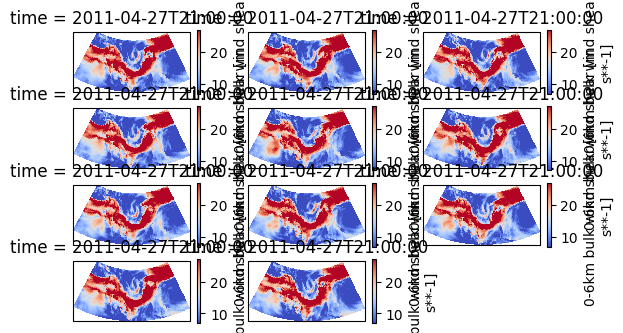

In [132]:
for member in ds_sel.ens.values:
    ax = plt.subplot(5, 3, member + 1, projection= ccrs.LambertConformal())
    ds = ds_sel.sel(ens = member)
    ds.shear6km.plot.pcolormesh(ax= ax, cmap= 'coolwarm', transform= ccrs.PlateCarree())
    

In [118]:
ds_sel['ens']

<xarray.DataArray 'ens' (ens: 11)>
array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10])
Coordinates:
    time     datetime64[ns] 2011-04-27T21:00:00
Dimensions without coordinates: ens

ValueError: DataArray must be 2d

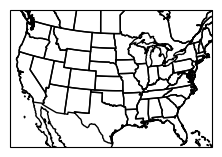

In [98]:
fig = plt.figure(figsize= (12, 6))
for i, time in enumerate([ds_avg.time.values]):
    ax = plt.subplot(2, 4, i + 1, projection= ccrs.LambertConformal())
    ax.set_extent([ds_avg.lon.min() + 20, ds_avg.lon.max() - 20, ds_avg.lat.min() + 3, ds_avg.lat.max() - 3])
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.STATES)
    ds_avg[i].plot.pcolormesh(ax= ax, cmap= 'coolwarm', transform= ccrs.PlateCarree(), cbar_kwargs= {'label': None, 'extend': 'max', 'orientation': 'horizontal', 'pad': 0.05})
    # ds_avg[i].plot.contour(ax=ax, colors= 'k', transform= ccrs.PlateCarree())
    ax.set_title(f'{time}')

plt.suptitle(f'{ds_avg.name} ensemble $\mu$', y=0.97)

plt.tight_layout()


In [70]:
ds = xr.open_dataset('/home/scratch/GEFSv12/reforecasts/conus_subset/subset_vars_2011042700.nc')
ds['rolling'] = ds.z500.rolling(time= 3, center= True).mean()
ds['std'] = ds.z500.rolling(time= 3, center= True).std('time')
ds['standard_anomaly'] =  (ds['z500'] - ds['rolling']) / ds['std']
ds['standard_anomaly'].attrs['units'] = 'sigma'
ds = ds.dropna('time')

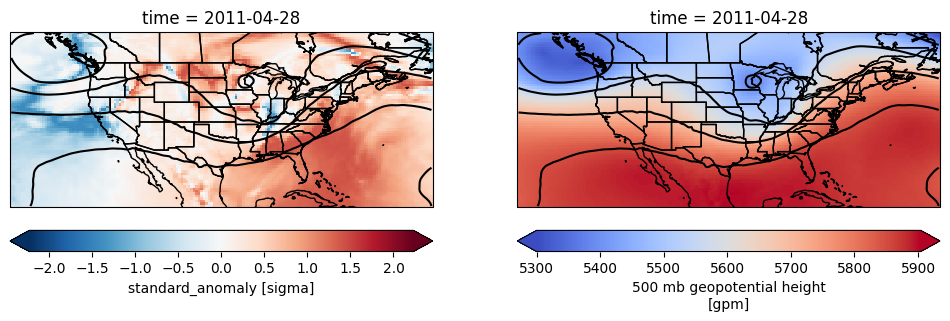

In [ ]:
ds.compute()

# Trying to train a som on standard anomalies



In [77]:
ds = xr.open_dataset('hpa500_test.nc')
ds['rolling'] = ds.z500.rolling(time= 3, center= True).mean()
ds['std'] = ds.z500.rolling(time= 3, center= True).std('time')
ds['standard_anomaly'] =  (ds['z500'] - ds['rolling']) / ds['std']
ds['standard_anomaly'].attrs['units'] = 'sigma'
ds['std'].attrs['units'] = 'gpm'
ds = ds.dropna('time')

# get rid of infinities

time_drops = ds.time[np.isinf(ds['standard_anomaly']).any(dim= ('lat', 'lon'))]
ds_final = ds.drop_sel(time= time_drops)
# ds_final.to_netcdf('./hpa500_standard_anomaly.nc')

In [78]:
prefs = {'filename': "./hpa500_standard_anomaly.nc", 
         'var': 'standard_anomaly', 'wlon': 220, 'elon': 305, 'nlat': 55, 'slat': 20, 
         'som_config': {'x': 4, 'y': 4, 'sigma': 1, 'random_seed': 42},
         'som_train': {'num_iteration': 10000, 'random_order': True, 'verbose': True}}

trained_som, trained_scaler, train_info, xr_data = train_som(wint_prefs)

win_map = trained_som.win_map(train_info['som_train']['data'])
avg_data = [np.reshape(trained_scaler.inverse_transform([np.mean(win_map[node], axis=0)])[0],(len(xr_data.lat), len(xr_data.lon)))for node in sorted(win_map.keys())]
node_keys = sorted(win_map.keys())

length, width = prefs['som_config']['x'], prefs['som_config']['y']
frequencies = trained_som.activation_response(train_info['som_train']['data']).flatten()

current model configuration
{'input_len': 12141, 'random_seed': 42, 'sigma': 1, 'x': 4, 'y': 4}
current training configuration
{'data': array([[-0.618974  , -0.61831903, -0.6225272 , ...,  0.7549301 ,
         0.7596261 ,  0.7731687 ],
       [ 0.7460519 ,  0.74273485,  0.7272409 , ..., -0.69640374,
        -0.68491614, -0.66271526],
       [-0.5835352 , -0.5735218 , -0.56454   , ...,  0.04357368,
         0.05267112,  0.06494776],
       ...,
       [ 0.6498556 ,  0.73123795,  0.777827  , ...,  0.25046706,
         0.2716742 ,  0.29598984],
       [ 0.42217857,  0.393417  ,  0.35240442, ...,  0.8025633 ,
         0.8119529 ,  0.82900137],
       [-0.45413485, -0.41232207, -0.37816182, ...,  0.67495453,
         0.744281  ,  0.80685055]], dtype=float32),
 'num_iteration': 10000,
 'random_order': True,
 'verbose': True}
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 46.90988890540921


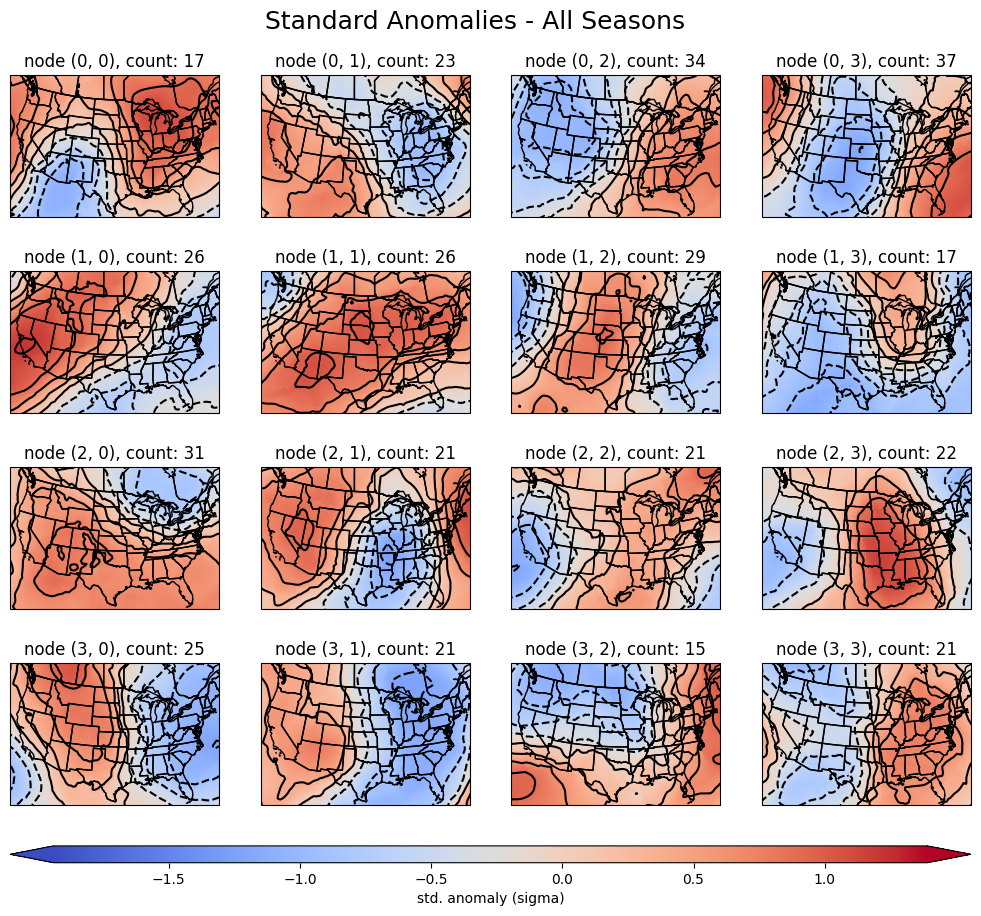

In [46]:
gs = GridSpec(nrows= length + 1, ncols= width, height_ratios=[1]*length + [0.1])
fig = plt.figure(figsize=(3.1 * length, 2.6 * width))

# levels = np.arange(np.min(avg_data), np.max(avg_data),
                   # (np.max(avg_data) - np.min(avg_data) / 10)):¶:¶

ax = [fig.add_subplot(gs[(x // length, x % width)], projection=ccrs.LambertConformal())
      for x in range(len(avg_data))]

# vmin = np.min(avg_data) - 20
# vmax = np.max(avg_data) + 20

vmin = np.min(avg_data)
vmax = np.max(avg_data)
norm = mcolors.Normalize(vmin=vmin, vmax=vmax)


for i, data in enumerate(avg_data):
    ax[i].set_extent([xr_data.lon.values.min() - 340, xr_data.lon.values.max() - 380,
                      xr_data.lat.values.min() + 3, xr_data.lat.values.max() - 3])
    ax[i].add_feature(cfeature.BORDERS)
    ax[i].add_feature(cfeature.STATES)
    
    cf = ax[i].pcolormesh(xr_data.lon, xr_data.lat, avg_data[i], cmap='coolwarm', norm= norm, transform=ccrs.PlateCarree())
    cn = ax[i].contour(xr_data.lon, xr_data.lat, avg_data[i],  colors='k', transform=ccrs.PlateCarree()) # add linestyles= '-' if dashed negatives aren't desireable
    # ax[i].clabel(cn, inline=True)
    ax[i].set_title(f'node {node_keys[i]}, count: {int(frequencies[i])}')
    
cax = fig.add_subplot(gs[-1, :])    
fig.colorbar(cf, cax=cax, label='std. anomaly (sigma)', extend= 'both', orientation='horizontal', aspect=0.8)

plt.suptitle('Standard Anomalies - All Seasons', fontsize=18, y=0.93)

plt.savefig('standard_anomalies.png', bbox_inches='tight')
# plt.tight_layout(pad=0.2, w_pad=0.5, h_pad=0.2)
plt.show()


## Distance between Nodes:

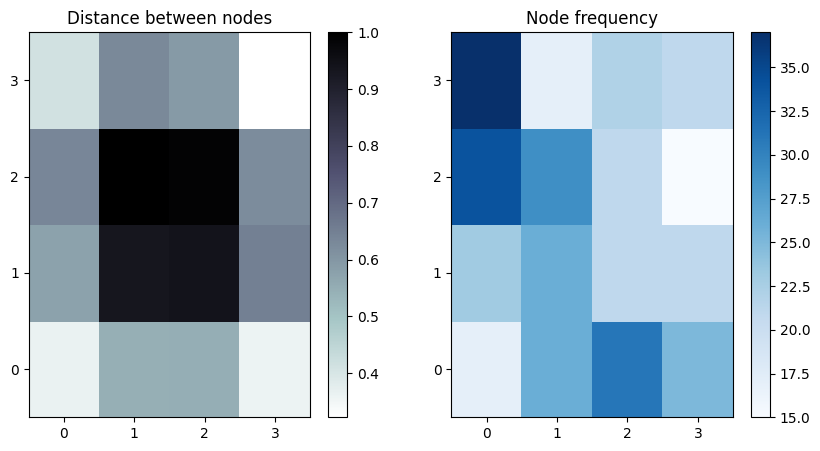

In [49]:
fig= plt.figure(figsize= (10, 5))
x = [x+0.5 for x in range(train_info['som_config']['x'])]
y = [y+0.5 for y in range(train_info['som_config']['y'])]

ax = plt.subplot(1, 2, 1)
ax.set_yticks(y, range(train_info['som_config']['y']))
ax.set_xticks(x, range(train_info['som_config']['x']))
ax.set_title("Distance between nodes")
mmp = ax.pcolor(trained_som.distance_map().T, cmap='bone_r')
plt.colorbar(mmp, ax=ax)

ax = plt.subplot(1, 2, 2)
ax.set_yticks(y, range(train_info['som_config']['y']))
ax.set_xticks(x, range(train_info['som_config']['x']))
ax.set_title("Node frequency")
mmp = ax.pcolor(trained_som.activation_response(train_info['som_train']['data']).T, cmap='Blues')
plt.colorbar(mmp, ax=ax)

# SPRING: (because I think it will be the most interesting)

In [70]:
ds = xr.open_dataset('spring_hpa500.nc')
ds['rolling'] = ds.z500.rolling(time= 3, center= True).mean()
ds['std'] = ds.z500.rolling(time= 3, center= True).std('time')
ds['standard_anomaly'] =  (ds['z500'] - ds['rolling']) / ds['std']
ds['standard_anomaly'].attrs['units'] = 'sigma'
ds['std'].attrs['units'] = 'gpm'
ds = ds.dropna('time')

# get rid of infinities

time_drops = ds.time[np.isinf(ds['standard_anomaly']).any(dim= ('lat', 'lon'))]
ds_final = ds.drop_sel(time= time_drops)
ds_final.to_netcdf('./spring_hpa500_standard_anomaly.nc')

In [59]:
prefs = {'filename': "./spring_hpa500_standard_anomaly.nc", 
         'var': 'standard_anomaly', 'wlon': 220, 'elon': 305, 'nlat': 55, 'slat': 20, 
         'som_config': {'x': 4, 'y': 4, 'sigma': 1, 'random_seed': 42},
         'som_train': {'num_iteration': 10000, 'random_order': True, 'verbose': True}}

trained_som, trained_scaler, train_info, xr_data = train_som(wint_prefs)

win_map = trained_som.win_map(train_info['som_train']['data'])
avg_data = [np.reshape(trained_scaler.inverse_transform([np.mean(win_map[node], axis=0)])[0],(len(xr_data.lat), len(xr_data.lon)))for node in sorted(win_map.keys())]
node_keys = sorted(win_map.keys())

length, width = prefs['som_config']['x'], prefs['som_config']['y']
frequencies = trained_som.activation_response(train_info['som_train']['data']).flatten()

current model configuration
{'input_len': 12141, 'random_seed': 42, 'sigma': 1, 'x': 4, 'y': 4}
current training configuration
{'data': array([[-0.618974  , -0.61831903, -0.6225272 , ...,  0.7549301 ,
         0.7596261 ,  0.7731687 ],
       [ 0.7460519 ,  0.74273485,  0.7272409 , ..., -0.69640374,
        -0.68491614, -0.66271526],
       [-0.5835352 , -0.5735218 , -0.56454   , ...,  0.04357368,
         0.05267112,  0.06494776],
       ...,
       [ 0.6498556 ,  0.73123795,  0.777827  , ...,  0.25046706,
         0.2716742 ,  0.29598984],
       [ 0.42217857,  0.393417  ,  0.35240442, ...,  0.8025633 ,
         0.8119529 ,  0.82900137],
       [-0.45413485, -0.41232207, -0.37816182, ...,  0.67495453,
         0.744281  ,  0.80685055]], dtype=float32),
 'num_iteration': 10000,
 'random_order': True,
 'verbose': True}
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 46.90988890540921


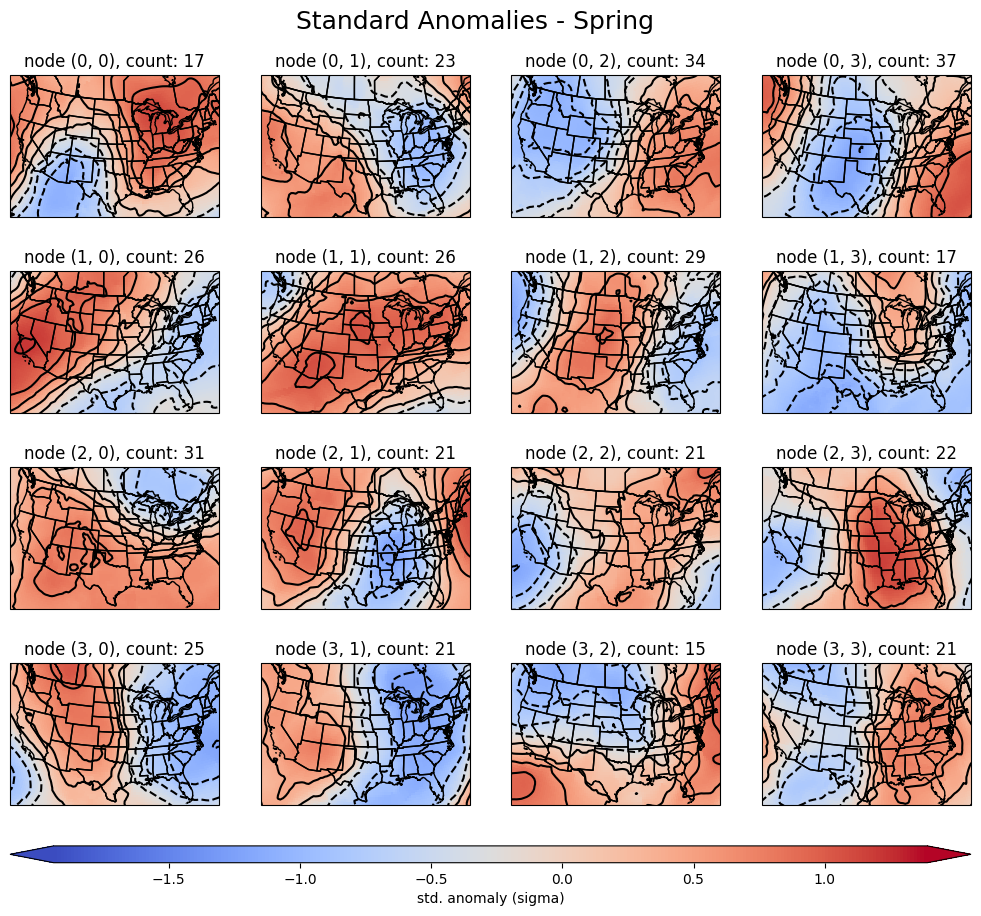

In [60]:
gs = GridSpec(nrows= length + 1, ncols= width, height_ratios=[1]*length + [0.1])
fig = plt.figure(figsize=(3.1 * length, 2.6 * width))

# levels = np.arange(np.min(avg_data), np.max(avg_data),
                   # (np.max(avg_data) - np.min(avg_data) / 10))

ax = [fig.add_subplot(gs[(x // length, x % width)], projection=ccrs.LambertConformal())
      for x in range(len(avg_data))]

# vmin = np.min(avg_data) - 20
# vmax = np.max(avg_data) + 20

vmin = np.min(avg_data)
vmax = np.max(avg_data)
norm = mcolors.Normalize(vmin=vmin, vmax=vmax)


for i, data in enumerate(avg_data):
    ax[i].set_extent([xr_data.lon.values.min() - 340, xr_data.lon.values.max() - 380,
                      xr_data.lat.values.min() + 3, xr_data.lat.values.max() - 3])
    ax[i].add_feature(cfeature.BORDERS)
    ax[i].add_feature(cfeature.STATES)
    
    cf = ax[i].pcolormesh(xr_data.lon, xr_data.lat, avg_data[i], cmap='coolwarm', norm= norm, transform=ccrs.PlateCarree())
    cn = ax[i].contour(xr_data.lon, xr_data.lat, avg_data[i],  colors='k', transform=ccrs.PlateCarree()) # add linestyles= '-' if dashed negatives aren't desireable
    # ax[i].clabel(cn, inline=True)
    ax[i].set_title(f'node {node_keys[i]}, count: {int(frequencies[i])}')
    
cax = fig.add_subplot(gs[-1, :])    
fig.colorbar(cf, cax=cax, label='std. anomaly (sigma)', extend= 'both', orientation='horizontal', aspect=0.8)

plt.suptitle('Standard Anomalies - Spring', fontsize=18, y=0.93)

plt.savefig('standard_anomalies_spring.png', bbox_inches='tight')
# plt.tight_layout(pad=0.2, w_pad=0.5, h_pad=0.2)
plt.show()


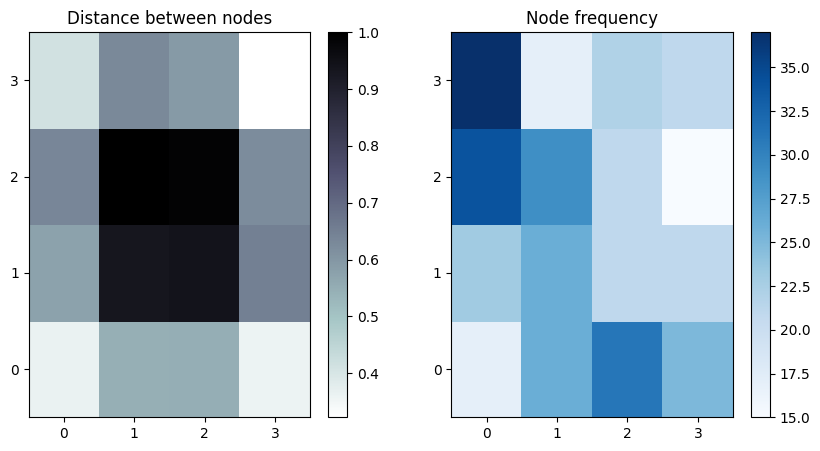

In [61]:
fig= plt.figure(figsize= (10, 5))
x = [x+0.5 for x in range(train_info['som_config']['x'])]
y = [y+0.5 for y in range(train_info['som_config']['y'])]

ax = plt.subplot(1, 2, 1)
ax.set_yticks(y, range(train_info['som_config']['y']))
ax.set_xticks(x, range(train_info['som_config']['x']))
ax.set_title("Distance between nodes")
mmp = ax.pcolor(trained_som.distance_map().T, cmap='bone_r')
plt.colorbar(mmp, ax=ax)

ax = plt.subplot(1, 2, 2)
ax.set_yticks(y, range(train_info['som_config']['y']))
ax.set_xticks(x, range(train_info['som_config']['x']))
ax.set_title("Node frequency")
mmp = ax.pcolor(trained_som.activation_response(train_info['som_train']['data']).T, cmap='Blues')
plt.colorbar(mmp, ax=ax)

In [75]:
ds = xr.open_dataset('hpa500_test.nc')
ds['rolling'] = ds.z500.rolling(time= 3, center= True).mean()
ds['std'] = ds.z500.rolling(time= 3, center= True).std('time')
ds['standard_anomaly'] =  (ds['z500'] - ds['rolling']) / ds['std']
ds['standard_anomaly'].attrs['units'] = 'sigma'
ds['std'].attrs['units'] = 'gpm'
ds = ds.dropna('time')

# get rid of infinities

time_drops = ds.time[np.isinf(ds['standard_anomaly']).any(dim= ('lat', 'lon'))]
ds_final = ds.drop_sel(time= time_drops)
# ds_final.to_netcdf('./hpa500_standard_anomaly.nc')

In [134]:
# display(ds)
# display(ds_final)


ds = xr.open_dataset('./hpa500_test.nc')
print(np.isnan(ds.z500.values.any()))

False


In [90]:
ds = xr.open_dataset('spring_hpa500.nc')
ds['rolling'] = ds.z500.rolling(time= 3, center= True, min_periods= 3).mean()
# ds = ds.dropna('time')
ds['std'] = ds.z500.rolling(time= 3, center= True, min_periods= 3).std('time')
# ds = ds.dropna('time')
ds['standard_anomaly'] =  (ds['z500'] - ds['rolling']) / ds['std']
ds['standard_anomaly'].attrs['units'] = 'sigma'
ds['std'].attrs['units'] = 'gpm'
# ds = ds.dropna('time')

# get rid of infinities

# time_drops = ds.time[np.isinf(ds['standard_anomaly']).any(dim= ('lat', 'lon'))]
# ds_final = ds.drop_sel(time= time_drops)
# ds_final.to_netcdf('./hpa500_standard_anomaly.nc')

In [91]:
display(ds)
display(ds_final)

<xarray.Dataset>
Dimensions:           (time: 263, lat: 71, lon: 171)
Coordinates:
  * time              (time) datetime64[ns] 2000-03-01 2000-03-08 ... 2019-05-29
  * lat               (lat) float32 55.0 54.5 54.0 53.5 ... 21.5 21.0 20.5 20.0
  * lon               (lon) float32 220.0 220.5 221.0 ... 304.0 304.5 305.0
Data variables:
    z500              (time, lat, lon) float32 5.258e+03 5.265e+03 ... 5.865e+03
    rolling           (time, lat, lon) float32 nan nan nan nan ... nan nan nan
    std               (time, lat, lon) float32 nan nan nan nan ... nan nan nan
    standard_anomaly  (time, lat, lon) float32 nan nan nan nan ... nan nan nan
Attributes:
    title:         Customized GEFSv12 Reforecasts
    grid:          0.5 degree CONUS subset
    author:        Dr. Victor Gensini
    author_email:  vgensini@niu.edu

<xarray.Dataset>
Dimensions:           (time: 192, lat: 71, lon: 171)
Coordinates:
  * time              (time) datetime64[ns] 2000-03-15 2000-03-22 ... 2019-05-01
  * lat               (lat) float32 55.0 54.5 54.0 53.5 ... 21.5 21.0 20.5 20.0
  * lon               (lon) float32 220.0 220.5 221.0 ... 304.0 304.5 305.0
Data variables:
    z500              (time, lat, lon) float32 5.397e+03 5.403e+03 ... 5.892e+03
    rolling           (time, lat, lon) float32 5.348e+03 5.35e+03 ... 5.858e+03
    std               (time, lat, lon) float32 66.19 65.38 64.39 ... 28.61 28.2
    standard_anomaly  (time, lat, lon) float32 0.7343 0.8015 ... 1.191 1.208
Attributes:
    title:         Customized GEFSv12 Reforecasts
    grid:          0.5 degree CONUS subset
    author:        Dr. Victor Gensini
    author_email:  vgensini@niu.edu

In [93]:
ds.standard_anomaly.min()

<xarray.DataArray 'standard_anomaly' ()>
array(-inf)